## Machine Learning
## STARTER CODE

---------
### Imports + Google Drive

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip (22.1 MB)
  Preparing metadata (setup.py) ... done


In [ ]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
import seaborn as sns; sns.set()
import scipy.stats as ss
from pandas_profiling import ProfileReport

from tensorflow import keras
from tensorflow.keras import layers

## Part 1: Regression Analysis


-----------
### 1a. Linear regression by least squares

In this part, we will look at the correlation between female literacy and fertility (defined as the average number of children born per woman) throughout the world. For ease of analysis and interpretation, we will work with the *illiteracy* rate.

The Python code below plots the fertility versus illiteracy and computes the Pearson correlation coefficient. The Numpy array `illiteracy` has the illiteracy rate among females for most of the world's nations. The array `fertility` has the corresponding fertility data.

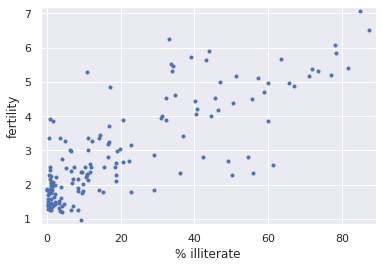

Pearson correlation coefficient between illiteracy and fertility: 0.80413


In [ ]:
df = pd.read_csv('https://github.com/ogemarques/data-files/raw/main/female_literacy_fertility.csv')
illiteracy = 100 - df['female literacy']
fertility = df['fertility']

def pearson_r(x, y):
    """Compute Pearson correlation coefficient between two arrays."""
    # Compute correlation matrix: corr_mat
    corr_mat = np.corrcoef(x, y)

    # Return entry [0,1]
    return corr_mat[0,1]

# Plot the illiteracy rate versus fertility
_ = plt.plot(illiteracy, fertility, marker='.', linestyle='none')

# Set the margins and label axes
plt.margins(0.02)
_ = plt.xlabel('% illiterate')
_ = plt.ylabel('fertility')

# Show the plot
plt.show()

# Show the Pearson correlation coefficient
print('Pearson correlation coefficient between illiteracy and fertility: {:.5f}'.format(pearson_r(illiteracy, fertility)))

We will assume that fertility is a linear function of the female illiteracy rate: `f=ai+b`, where `a` is the slope and `b` is the intercept.

We can think of the intercept as the minimal fertility rate, probably somewhere between one and two.

The slope tells us how the fertility rate varies with illiteracy.
We can find the best fit line .

Write code to plot the data and the best fit line (using `np.polyfit()`) and print out the slope and intercept.

Slope: 0.04979854809063423
Intercept: 1.8880506106365567


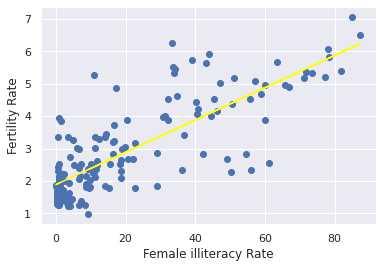

In [ ]:
a, b = np.polyfit(illiteracy, fertility, 1)

print("Slope:", a)
print("Intercept:", b)

plt.scatter(illiteracy, fertility)
plt.plot(illiteracy, a*illiteracy + b, color='yellow')
plt.xlabel("Female illiteracy Rate")
plt.ylabel("Fertility Rate")
plt.show()

-------------------
### 1b. Anscombe's quartet

The Anscombe's quartet is a collection of four small data sets that have nearly identical simple descriptive statistics, yet have very different distributions. Each dataset consists of 11 `(x,y)` points. The quartet was created in 1973 by the statistician Francis Anscombe to demonstrate: the importance of visualization and exploratory data analysis (EDA), the effect of outliers and other influential observations on statistical properties, and the limitations of summary statistics (\*).

(\*) See https://heap.io/blog/data-stories/anscombes-quartet-and-why-summary-statistics-dont-tell-the-whole-story if you're interested.

The Python code below performs a linear regression on the data set from Anscombe's quartet that is most reasonably interpreted with linear regression.

In [ ]:
x1 = [10.0, 8.0,  13.0,  9.0,  11.0, 14.0, 6.0,  4.0,  12.0,  7.0,  5.0]
y1 = [8.04, 6.95, 7.58,  8.81, 8.33, 9.96, 7.24, 4.26, 10.84, 4.82, 5.68]

x2 = [10.0, 8.0,  13.0,  9.0,  11.0, 14.0, 6.0,  4.0,  12.0,  7.0,  5.0]
y2 = [9.14, 8.14, 8.74,  8.77, 9.26, 8.10, 6.13, 3.10, 9.13,  7.26, 4.74]

x3 = [10.0, 8.0,  13.0,  9.0,  11.0, 14.0, 6.0,  4.0,  12.0,  7.0,  5.0]
y3 = [7.46, 6.77, 12.74, 7.11, 7.81, 8.84, 6.08, 5.39, 8.15,  6.42, 5.73]

x4 = [8.0,  8.0,  8.0,   8.0,  8.0,  8.0,  8.0,  19.0,  8.0,  8.0,  8.0]
y4 = [6.58, 5.76, 7.71,  8.84, 8.47, 7.04, 5.25, 12.50, 5.56, 7.91, 6.89]

slope = 0.5000909090909094
intercept = 3.000090909090908


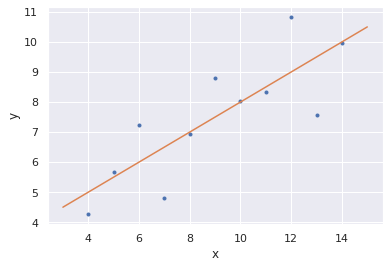

In [ ]:
# Perform linear regression: a, b
a, b = np.polyfit(x1, y1, 1)

# Print the slope and intercept
print('slope =', a)
print('intercept =', b)

# Generate theoretical x and y data: x_theor, y_theor
x_theor = np.array([3, 15])
y_theor = a * x_theor + b

# Plot the Anscombe data and theoretical line
_ = plt.plot(x1, y1, marker='.', linestyle='none')
_ = plt.plot(x_theor, y_theor)

# Label the axes
plt.xlabel('x')
plt.ylabel('y')

# Show the plot
plt.show()


### Linear regression on all Anscombe data

Write code to verify that all four of the Anscombe data sets have the same slope and intercept from a linear regression, i.e. compute the slope and intercept for each set.

The data are stored in lists (`anscombe_x = [x1, x2, x3, x4]` and `anscombe_y = [y1, y2, y3, y4]`), corresponding to the $x$ and $y$ values for each Anscombe data set.

In [ ]:
anscombe_x = [x1, x2, x3, x4]
anscombe_y = [y1, y2, y3, y4]

for i in range(len(anscombe_x)):
    a, b = np.polyfit(anscombe_x[i], anscombe_y[i], 1)
    print("Data set", i+1)
    print("Slope:", a)
    print("Intercept:", b)
    print("")

Data set 1
Slope: 0.5000909090909094
Intercept: 3.000090909090908

Data set 2
Slope: 0.5000000000000006
Intercept: 3.0009090909090883

Data set 3
Slope: 0.49972727272727313
Intercept: 3.0024545454545453

Data set 4
Slope: 0.49990909090909097
Intercept: 3.0017272727272717



-------------------
### 1c. Regression using scikit-learn

Now that we know the basics of linear regression, we will switch to scikit-learn, a powerful, workflow-oriented library for data science and machine learning.

The Python code below shows a simple linear regression example using scikit-learn. Note the use of the `fit()` and `predict()` methods.

[2.9776566]
-1.903310725531119


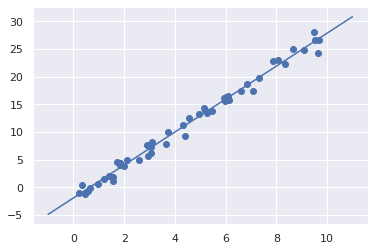

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Generate random data around the y = ax+b line where a=3 and b=-2
rng = np.random.RandomState(42)
x = 10 * rng.rand(50)
y = 3 * x - 2 + rng.randn(50)

from sklearn.linear_model import LinearRegression

# Note: If you get a "ModuleNotFoundError: No module named 'sklearn'" error message, don't panic.
# It probably means you'll have to install the module by hand if you're using pip.
# If you're using conda, you should not see any error message.

model = LinearRegression(fit_intercept=True)

X = x[:, np.newaxis]
X.shape

model.fit(X, y)
print(model.coef_)
print(model.intercept_)

xfit = np.linspace(-1, 11)
Xfit = xfit[:, np.newaxis]
yfit = model.predict(Xfit)

plt.scatter(x, y)
plt.plot(xfit, yfit);

### 1d. Polynomial regression

One way to adapt linear regression to nonlinear relationships between variables is to transform the data according to *basis functions*.

The idea is to take the multidimensional linear model:
$$
y = a_0 + a_1 x_1 + a_2 x_2 + a_3 x_3 + \cdots
$$
and build the $x_1, x_2, x_3,$ and so on, from our single-dimensional input $x$.
That is, we let $x_n = f_n(x)$, where $f_n()$ is some function that transforms our data.

For example, if $f_n(x) = x^n$, our model becomes a polynomial regression:
$$
y = a_0 + a_1 x + a_2 x^2 + a_3 x^3 + \cdots
$$
Notice that this is *still a linear model*—the linearity refers to the fact that the coefficients $a_n$ never multiply or divide each other.
What we have effectively done is taken our one-dimensional $x$ values and projected them into a higher dimension, so that a linear fit can fit more complicated relationships between $x$ and $y$.

The code below shows a simple example of polynomial regression using the ``PolynomialFeatures`` transformer in scikit-learn. Concretely, it shows how we can use polynomial features with a polynomial of degree seven, i.e. $$y = a_0 + a_1 x + a_2 x^2 + a_3 x^3 + \cdots + a_7 x^7$$

It also introduces the notion of a *pipeline* in scikit-learn. "The purpose of the pipeline is to assemble several steps that can be cross-validated together while setting different parameters." (https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html)

The R^2 score for the fit is:  0.9806993128749489


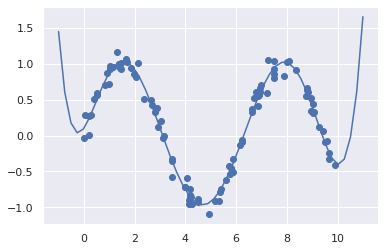

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
poly_model = make_pipeline(PolynomialFeatures(7),
                           LinearRegression())

rng = np.random.RandomState(1)
x = 10 * rng.rand(100)
y = np.sin(x) + 0.1 * rng.randn(100)

poly_model.fit(x[:, np.newaxis], y)
yfit = poly_model.predict(xfit[:, np.newaxis])

plt.scatter(x, y)
plt.plot(xfit, yfit);

print('The R^2 score for the fit is: ', poly_model.score(x[:, np.newaxis], y))

Our linear model, through the use of 7th-order polynomial basis functions, can provide an excellent fit to this non-linear data!

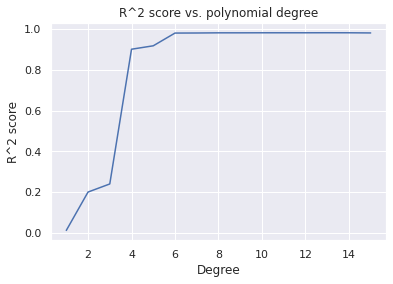

In [ ]:
#Degree/order for Polynomial basis functions:

degrees = range(1, 16)
r2_scores = []
for degree in degrees:
    poly_features = PolynomialFeatures(degree=degree)
    X_poly = poly_features.fit_transform(x.reshape(-1, 1))
    model = LinearRegression()
    model.fit(X_poly, y)
    r2_score = model.score(X_poly, y)
    r2_scores.append(r2_score)
plt.plot(degrees, r2_scores)
plt.xlabel('Degree')
plt.ylabel('R^2 score')
plt.title('R^2 score vs. polynomial degree')
plt.show()

### 1e. Regularization

The use of polynomial regression with high-order polynomials can very quickly lead to over-fitting. In this part, we will look into the use of regularization to address potential overfitting.

The code below shows an attempt to fit a 15th degree polynomial to a sinusoidal shaped data. The fit is excellent ($R^2$ > 0.98), but might raise suspicions that it will lead to overfitting.

0.9806993128749489


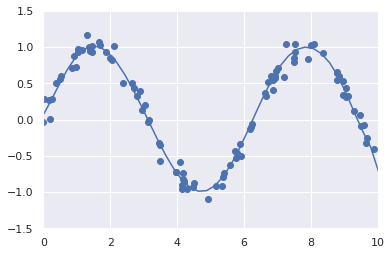

In [ ]:
model = make_pipeline(PolynomialFeatures(15),
                      LinearRegression())
model.fit(x[:, np.newaxis], y)

plt.scatter(x, y)
plt.plot(xfit, model.predict(xfit[:, np.newaxis]))

plt.xlim(0, 10)
plt.ylim(-1.5, 1.5);

score = poly_model.score(x[:, np.newaxis], y)
print(score)

1. This type of penalized model is built into Scikit-Learn with the ``Ridge`` estimator.
2. In the beginning, use all default values for its parameters.
3. After you get your code to work, spend some time trying to fine-tune the model, i.e., experimenting with the regularization parameters.

R^2 score: 0.9146928554680493


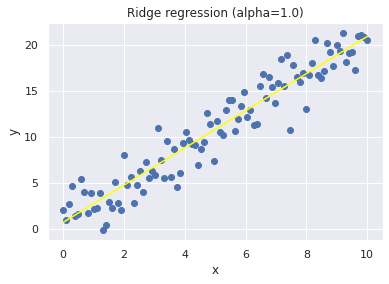

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score

np.random.seed(42)
x = np.linspace(0, 10, 100)
y = 2 * x + 1 + np.random.normal(scale=2, size=len(x))
model = Ridge(alpha=1.0)
model.fit(x.reshape(-1, 1), y)
x_test = np.linspace(0, 10, 100)
y_test_pred = model.predict(x_test.reshape(-1, 1))
r2 = r2_score(y, model.predict(x.reshape(-1, 1)))
print("R^2 score:", r2)

plt.scatter(x, y)
plt.plot(x_test, y_test_pred, color='yellow')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Ridge regression (alpha=1.0)')
plt.show()



Write Python code to perform Lasso regression ($L_1$ Regularization), plot the resulting fit, and compute the $R^2$ score.

Hints:
1. This type of penalized model is built into Scikit-Learn with the ``Lasso`` estimator.
2. In the beginning, use `Lasso(alpha=0.1, tol=0.2)`
3. After you get your code to work, spend some time trying to fine-tune the model, i.e., experimenting with the regularization parameters.

Coefficients: [-1.32815493  1.38193063  0.00504146  0.18457903 -0.45027327  1.37669317
  2.27048399  0.11028813  1.25087248 -0.66738649]
R2 score: 0.98


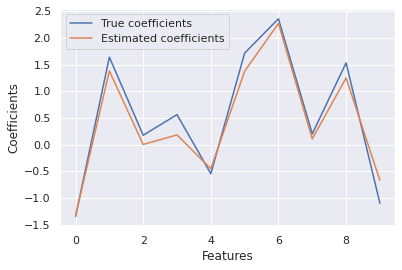

In [ ]:
# Lasso Estimate:

from sklearn.linear_model import Lasso
np.random.seed(43)
n_samples, n_features = 50, 10
X = np.random.randn(n_samples, n_features)
coef = np.random.randn(n_features)
y = np.dot(X, coef) + 0.1 * np.random.randn(n_samples)
alpha = 0.1
tol = 0.2
lasso = Lasso(alpha=alpha, tol=tol)
lasso.fit(X, y)
print(f"Coefficients: {lasso.coef_}")
print(f"R2 score: {r2_score(y, lasso.predict(X)):.2f}")

fig, ax = plt.subplots()
ax.plot(coef, label='True coefficients')
ax.plot(lasso.coef_, label='Estimated coefficients')
ax.set_xlabel('Features')
ax.set_ylabel('Coefficients')
ax.legend()
plt.show()

### 1f. The housing problem
The Boston housing dataset is a classic dataset used in linear regression examples.
(See https://scikit-learn.org/stable/datasets/index.html#boston-dataset for more)

The Python code below:
- Loads the Boston dataset (using scikit-learn's `load_boston()`) and converts it into a Pandas dataframe
- Selects two features to be used for fitting a model that will then be used to make predictions: LSTAT (% lower status of the population) and RM (average number of rooms per dwelling) (\*)
- Splits the data into train and test sets

(\*) See https://towardsdatascience.com/linear-regression-on-boston-housing-dataset-f409b7e4a155 for details.

In [ ]:
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)

df1 = raw_df.shift(-1).iloc[::2, :]
boston = pd.concat([raw_df, df1], axis=1)
boston.dropna(axis = 1, how='all',inplace = True)
boston.dropna(axis = 0, how='any',inplace = True)

boston.columns = ['CRIM','ZN','INDUS','CHAS','NOX','RM','AGE','DIS','RAD','TAX','PTRATIO','B','LSTAT','MEDV']
boston.reset_index(inplace = True)
boston.drop(columns = ['index'],inplace = True)

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=5)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(40, 10)
(10, 10)
(40,)
(10,)


In [ ]:
# fun with pandas_profiling
profile = ProfileReport(boston, title='Pandas Profiling Report for Boston Housing Dataset', explorative=True)

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


1. Fit a linear model to the data.
2. Compute and print the RMSE and $R^2$ score for both train and test datasets.
3. Fit a polynomial model (of degree 4) to the data.
4. Compute and print the RMSE and $R^2$ score for both train and test datasets.
5. Apply Ridge regression to the polynomial model.
4. Compute and print the RMSE and $R^2$ score for both train and test datasets.

In [ ]:
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Fit a linear model to the data.
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

#Compute and print the RMSE and $R^2$ score for both train and test datasets.
y_train_pred = linear_model.predict(X_train)
linear_rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
linear_r2_train = r2_score(y_train, y_train_pred)
print("Linear Model - Training Set RMSE: ", linear_rmse_train)
print("Linear Model - Training Set R2 Score: ", linear_r2_train)


y_test_pred = linear_model.predict(X_test)
linear_rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
linear_r2_test = r2_score(y_test, y_test_pred)
print("Linear Model - Testing Set RMSE: ", linear_rmse_test)
print("Linear Model - Testing Set R2 Score: ", linear_r2_test)

#Fit a polynomial model (of degree 4) to the data.
poly_features = PolynomialFeatures(degree=4)
X_poly_train = poly_features.fit_transform(X_train)
X_poly_test = poly_features.fit_transform(X_test)
poly_model = LinearRegression()
poly_model.fit(X_poly_train, y_train)


y_poly_train_pred = poly_model.predict(X_poly_train)
poly_rmse_train = np.sqrt(mean_squared_error(y_train, y_poly_train_pred))
poly_r2_train = r2_score(y_train, y_poly_train_pred)
print("Polynomial Model - Training Set RMSE: ", poly_rmse_train)
print("Polynomial Model - Training Set R2 Score: ", poly_r2_train)


y_poly_test_pred = poly_model.predict(X_poly_test)
poly_rmse_test = np.sqrt(mean_squared_error(y_test, y_poly_test_pred))
poly_r2_test = r2_score(y_test, y_poly_test_pred)
print("Polynomial Model - Testing Set RMSE: ", poly_rmse_test)
print("Polynomial Model - Testing Set R2 Score: ", poly_r2_test)

#Apply Ridge regression to the polynomial model.
ridge_model = Ridge(alpha=0.01)
ridge_model.fit(X_poly_train, y_train)


y_ridge_train_pred = ridge_model.predict(X_poly_train)
ridge_rmse_train = np.sqrt(mean_squared_error(y_train, y_ridge_train_pred))
ridge_r2_train = r2_score(y_train, y_ridge_train_pred)
print("Ridge Regression")


Linear Model - Training Set RMSE:  0.07302409657267685
Linear Model - Training Set R2 Score:  0.9996492418892169
Linear Model - Testing Set RMSE:  0.08221129045353004
Linear Model - Testing Set R2 Score:  0.9995071943173645
Polynomial Model - Training Set RMSE:  4.669624145871723e-15
Polynomial Model - Training Set R2 Score:  1.0
Polynomial Model - Testing Set RMSE:  3.323702646301213
Polynomial Model - Testing Set R2 Score:  0.19451565837403428
Ridge Regression


-------------------
## Part 2: Classification

### 2a. The Iris dataset

The Python code below will load a dataset containing information about three types of Iris flowers that had the size of its petals and sepals carefully measured.

The Fisher’s Iris dataset contains 150 observations with 4 features each:
- sepal length in cm;
- sepal width in cm;
- petal length in cm; and
- petal width in cm.

The class for each instance is stored in a separate column called “species”. In this case, the first 50 instances belong to class Setosa, the following 50 belong to class Versicolor and the last 50 belong to class Virginica.

See:
https://archive.ics.uci.edu/ml/datasets/Iris for additional information.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
iris = sns.load_dataset("iris")
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


#### Histograms, pair plots and summary statistics

The code below:

1. Computes and displays relevant summary statistics for the whole dataset.
2. Displays the pair plots for all (4) attributes for all (3) categories / species / classes in the Iris dataset.

,sepal_length,sepal_width,petal_length,petal_width
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.057333,3.758000,1.199333
std,0.828066,0.435866,1.765298,0.762238
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


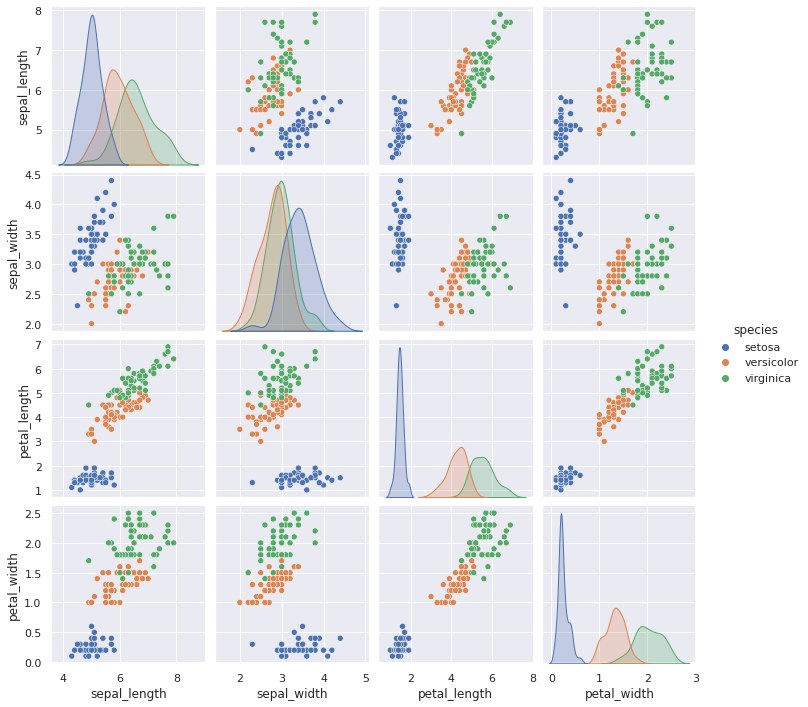

In [ ]:
# Display pair plot
sns.pairplot(iris, hue='species', height=2.5);

# Display summary statistics for the whole dataset
iris.describe()

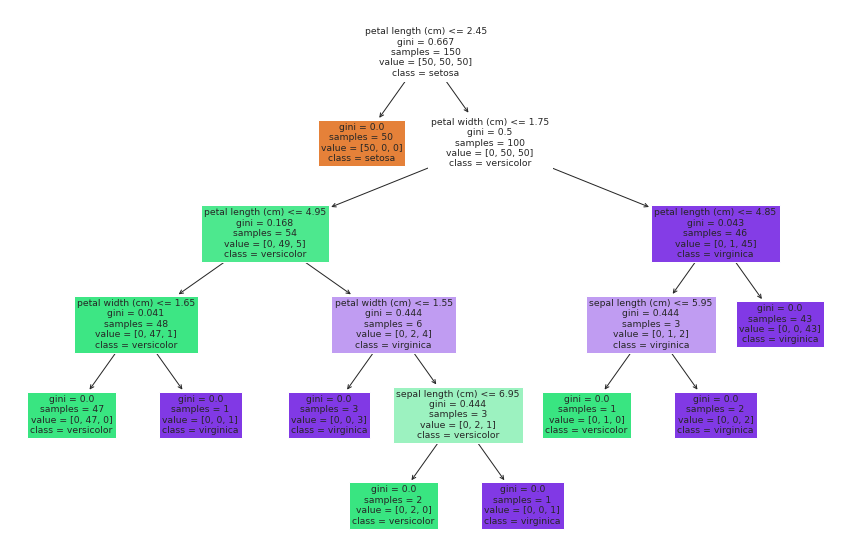

|--- petal length (cm) <= 2.45
|   |--- class: 0
|--- petal length (cm) >  2.45
|   |--- petal width (cm) <= 1.75
|   |   |--- petal length (cm) <= 4.95
|   |   |   |--- petal width (cm) <= 1.65
|   |   |   |   |--- class: 1
|   |   |   |--- petal width (cm) >  1.65
|   |   |   |   |--- class: 2
|   |   |--- petal length (cm) >  4.95
|   |   |   |--- petal width (cm) <= 1.55
|   |   |   |   |--- class: 2
|   |   |   |--- petal width (cm) >  1.55
|   |   |   |   |--- sepal length (cm) <= 6.95
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- sepal length (cm) >  6.95
|   |   |   |   |   |--- class: 2
|   |--- petal width (cm) >  1.75
|   |   |--- petal length (cm) <= 4.85
|   |   |   |--- sepal length (cm) <= 5.95
|   |   |   |   |--- class: 1
|   |   |   |--- sepal length (cm) >  5.95
|   |   |   |   |--- class: 2
|   |   |--- petal length (cm) >  4.85
|   |   |   |--- class: 2

Cross-validation scores:  [0.98 0.92 1.  ]


In [ ]:
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier, export_text, plot_tree
from sklearn.model_selection import cross_val_score

iris = load_iris()
clf = DecisionTreeClassifier()
clf.fit(iris.data, iris.target)

plt.figure(figsize=(15,10))
plot_tree(clf, filled=True, feature_names=iris.feature_names, class_names=iris.target_names)
plt.show()
tree_rules = export_text(clf, feature_names=iris.feature_names)
print(tree_rules)
scores = cross_val_score(clf, iris.data, iris.target, cv=3)
print("Cross-validation scores: ", scores)


### 2b. Digit classification

The MNIST handwritten digit dataset consists of a training set of 60,000 examples, and a test set of 10,000 examples. Each image in the dataset has 28$\times$28 pixels.

The Python code below loads the images from the MNIST dataset, flattens them, normalizes them (i.e., maps the intensity values from [0..255] to [0..1]), and displays a few images from the training set.

In [ ]:
from keras.datasets import mnist

# Model / data parameters
num_classes = 10
input_shape = (28, 28, 1)

# the data, split between train and validation sets
(X_train, y_train), (X_valid, y_valid) = mnist.load_data()

11490434/11490434 [==============================] - 1s 0us/step


In [ ]:
X_train.shape

(60000, 28, 28)

In [ ]:
y_train.shape

(60000,)

In [ ]:
y_train[0:12]

array([5, 0, 4, 1, 9, 2, 1, 3, 1, 4, 3, 5], dtype=uint8)

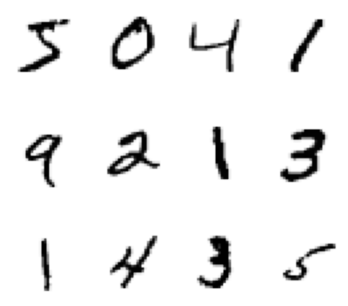

In [ ]:
plt.figure(figsize=(5,5))
for k in range(12):
    plt.subplot(3, 4, k+1)
    plt.imshow(X_train[k], cmap='Greys')
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
X_valid.shape

(10000, 28, 28)

In [ ]:
y_valid.shape

(10000,)

In [ ]:
y_valid[0]

7

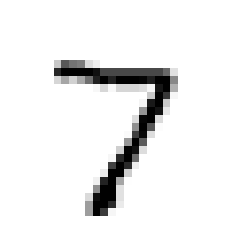

In [ ]:
plt.imshow(X_valid[0], cmap='Greys')
plt.axis('off')
plt.show()

In [ ]:
# Reshape (flatten) images
X_train_reshaped = X_train.reshape(60000, 784).astype('float32')
X_valid_reshaped = X_valid.reshape(10000, 784).astype('float32')

# Scale images to the [0, 1] range
X_train_scaled_reshaped = X_train_reshaped / 255
X_valid_scaled_reshaped = X_valid_reshaped / 255

# Renaming for conciseness
X_training = X_train_scaled_reshaped
X_validation = X_valid_scaled_reshaped

print("X_training shape (after reshaping + scaling):", X_training.shape)
print(X_training.shape[0], "train samples")
print("X_validation shape (after reshaping + scaling):", X_validation.shape)
print(X_validation.shape[0], "validation samples")

X_training shape (after reshaping + scaling): (60000, 784)
60000 train samples
X_validation shape (after reshaping + scaling): (10000, 784)
10000 validation samples


In [ ]:
# convert class vectors to binary class matrices
y_training = keras.utils.to_categorical(y_train, num_classes)
y_validation = keras.utils.to_categorical(y_valid, num_classes)

In [ ]:
print(y_valid[0])
print(y_validation[0])

7
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]


### 2.2 Your turn! (10 points)

Write code to:

1. Build and fit a 10-class Naive Bayes classifier using scikit-learn's `MultinomialNB()` with default options and using the raw pixel values as features.
2. Make predictions on the test data, compute the overall accuracy and plot the resulting confusing matrix.

Hint: your accuracy will be around 83.5%

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.datasets import fetch_openml
from sklearn.metrics import confusion_matrix, accuracy_score
from keras.datasets import mnist
from sklearn.ensemble import RandomForestClassifier

/usr/local/lib/python3.8/dist-packages/sklearn/datasets/_openml.py:932: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


Accuracy: 0.8365


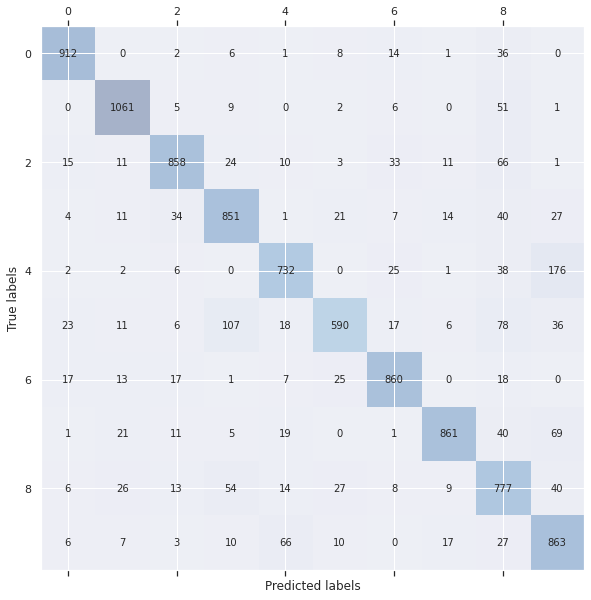

In [ ]:
mnist = fetch_openml('mnist_784', version=1)

X = mnist.data.astype('float32')
y = mnist.target.astype('int')

n_train = 60000
X_train, y_train = X[:n_train], y[:n_train]
X_test, y_test = X[n_train:], y[n_train:]

model = MultinomialNB()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

conf_matrix = confusion_matrix(y_test, y_pred)
fig, ax = plt.subplots(figsize=(10, 10))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i, s=conf_matrix[i, j], va='center', ha='center', fontsize=10)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()



1. Build and fit a 10-class Random Forests classifier using scikit-learn's `RandomForestClassifier()` with default options (don't forget `random_state=0`) and using the raw pixel values as features.
2. Make predictions on the test data, compute the overall accuracy and plot the resulting confusing matrix.


Accuracy: 0.9705


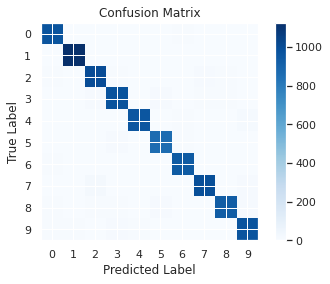

In [ ]:
import tensorflow as tf

mnist = tf.keras.datasets.mnist
(X_train, y_train), (X_test, y_test) = mnist.load_data()


X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)


rf = RandomForestClassifier(n_estimators=100, random_state=0)


rf.fit(X_train, y_train)


y_pred = rf.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


conf_matrix = confusion_matrix(y_test, y_pred)
plt.imshow(conf_matrix, cmap='Blues')
plt.title("Confusion Matrix")
plt.colorbar()
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.xticks(np.arange(10))
plt.yticks(np.arange(10))
plt.show()



1. Build and fit a 10-class classifier of your choice, with sensible initialization options, and using the raw pixel values as features.
2. Make predictions on the test data, compute the overall accuracy and plot the resulting confusing matrix.


Epoch 1/10
1875/1875 [==============================] - 14s 6ms/step - loss: 0.2619 - accuracy: 0.9243
Epoch 2/10
1875/1875 [==============================] - 11s 6ms/step - loss: 0.1125 - accuracy: 0.9671
Epoch 3/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0788 - accuracy: 0.9762
Epoch 4/10
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0588 - accuracy: 0.9821
Epoch 5/10
1875/1875 [==============================] - 11s 6ms/step - loss: 0.0463 - accuracy: 0.9858
Epoch 6/10
1875/1875 [==============================] - 8s 5ms/step - loss: 0.0363 - accuracy: 0.9887
Epoch 7/10
1875/1875 [==============================] - 10s 6ms/step - loss: 0.0295 - accuracy: 0.9907
Epoch 8/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.0238 - accuracy: 0.9925
Epoch 9/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.0198 - accuracy: 0.9942
Epoch 10/10
313/313 [==============================] - 1s 2ms/step
Accuracy:

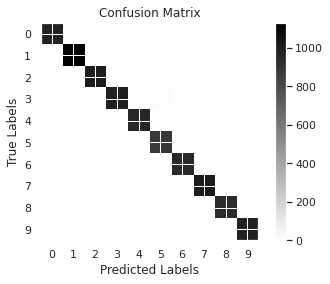

In [ ]:
(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()


x_train = x_train / 255.0
x_test = x_test / 255.0


y_train = keras.utils.to_categorical(y_train, 10)
y_test = keras.utils.to_categorical(y_test, 10)


model = keras.Sequential([
    keras.layers.Flatten(input_shape=(28, 28)),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(10, activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


model.fit(x_train, y_train, epochs=10, batch_size=32)

y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)
accuracy = accuracy_score(y_test_classes, y_pred_classes)
conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)

print("Accuracy:", accuracy)
print("Confusion matrix:\n", conf_matrix)

plt.imshow(conf_matrix, cmap='binary')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.xticks(np.arange(10))
plt.yticks(np.arange(10))
plt.title('Confusion Matrix')
plt.colorbar()
plt.show()

## Part 3: Face Recognition using PCA (eigenfaces)


We will use a subset of the Labeled Faces in the Wild (LFW) people dataset: https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_lfw_people.html

The Python code below loads a dataset of 1867 images (resized to 62 $\times$ 47 pixels) from the dataset and displays some of them.

In [ ]:
from sklearn.datasets import fetch_lfw_people
faces = fetch_lfw_people(min_faces_per_person=40)
print(faces.target_names)
print(faces.images.shape)

['Ariel Sharon' 'Arnold Schwarzenegger' 'Colin Powell' 'Donald Rumsfeld'
 'George W Bush' 'Gerhard Schroeder' 'Gloria Macapagal Arroyo'
 'Hugo Chavez' 'Jacques Chirac' 'Jean Chretien' 'Jennifer Capriati'
 'John Ashcroft' 'Junichiro Koizumi' 'Laura Bush' 'Lleyton Hewitt'
 'Luiz Inacio Lula da Silva' 'Serena Williams' 'Tony Blair'
 'Vladimir Putin']
(1867, 62, 47)


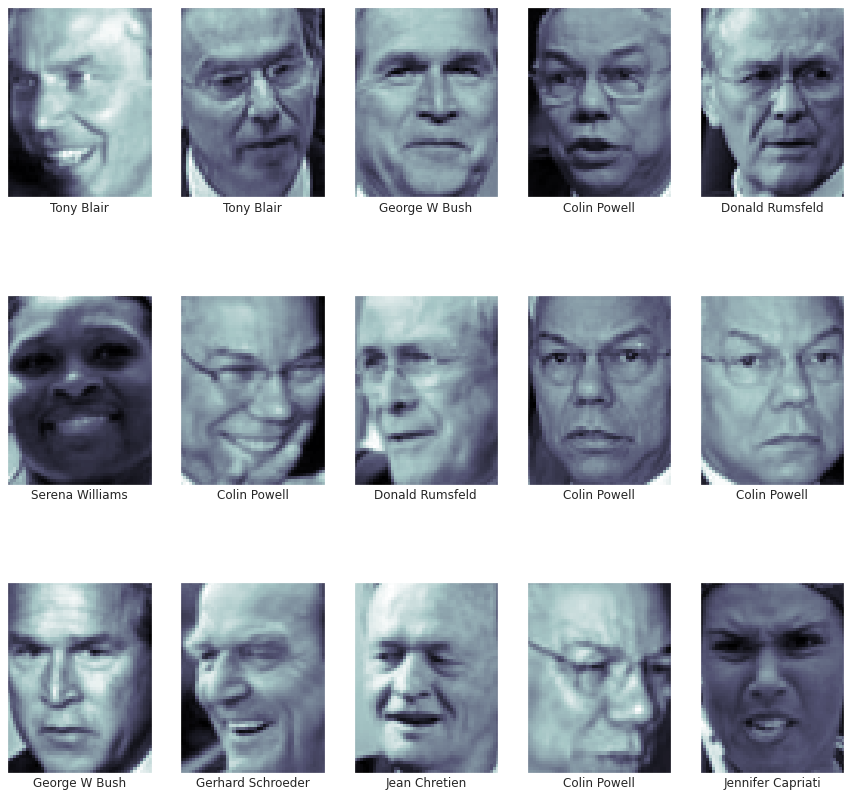

In [ ]:
plt.rcParams["figure.figsize"]=15,15
fig, ax = plt.subplots(3, 5)
for i, axi in enumerate(ax.flat):
    axi.imshow(faces.images[i], cmap='bone')
    axi.set(xticks=[], yticks=[],
            xlabel=faces.target_names[faces.target[i]])


1. Use Principal Component Analysis (PCA) to reduce the dimensionality of each face to the first 120 components.
2. Build and fit a multi-class SVM classifier, with sensible initialization options, and using the PCA-reduced  features.
3. Make predictions on the test data, compute the precision, recall and f1 score for each category, compute the overall accuracy, and plot the resulting confusing matrix.
4. Display examples of correct and incorrect predictions (at least 5 of each).

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                           precision    recall  f1-score   support

             Ariel Sharon       1.00      0.31      0.48        16
    Arnold Schwarzenegger       1.00      0.07      0.12        15
             Colin Powell       0.65      0.79      0.71        61
          Donald Rumsfeld       0.73      0.47      0.57        34
            George W Bush       0.52      0.96      0.67       135
        Gerhard Schroeder       0.67      0.35      0.46        23
  Gloria Macapagal Arroyo       1.00      0.82      0.90        11
              Hugo Chavez       0.90      0.50      0.64        18
           Jacques Chirac       0.00      0.00      0.00        11
            Jean Chretien       0.80      0.57      0.67        14
        Jennifer Capriati       1.00      0.11      0.20         9
            John Ashcroft       1.00      0.15      0.27        13
        Junichiro Koizumi       1.00      0.69      0.81        16
               Laura Bush       1.00      0.82      0.90     

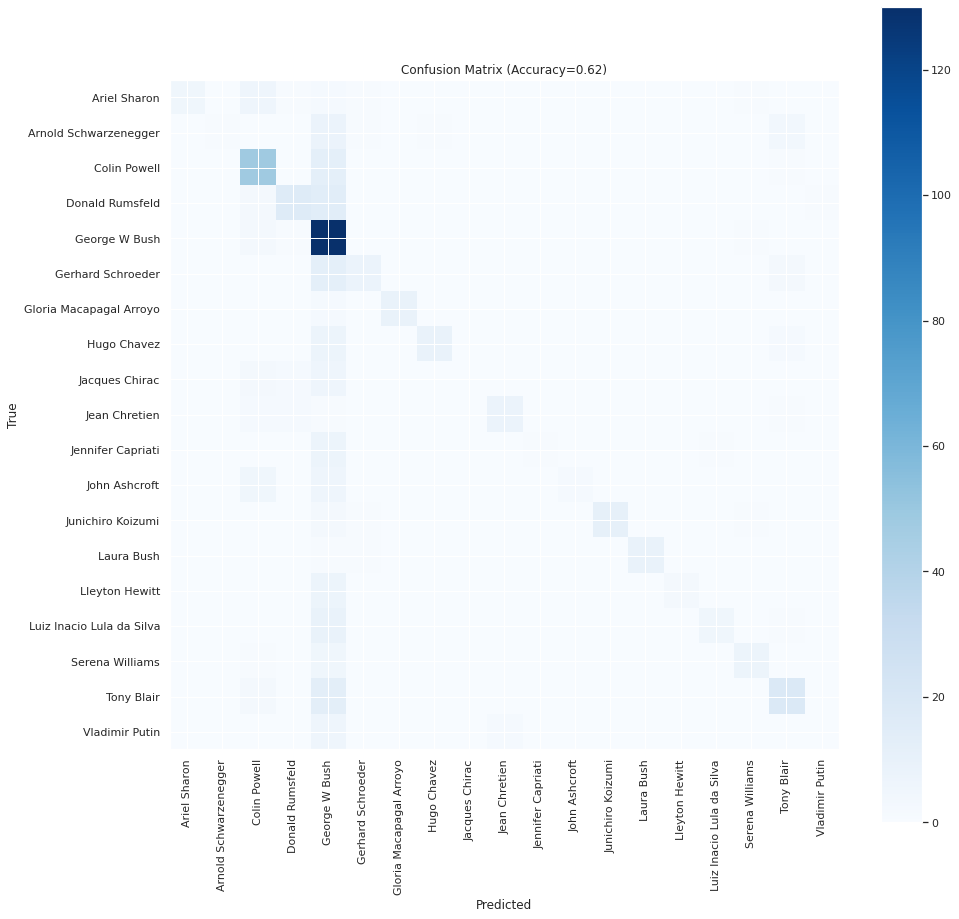

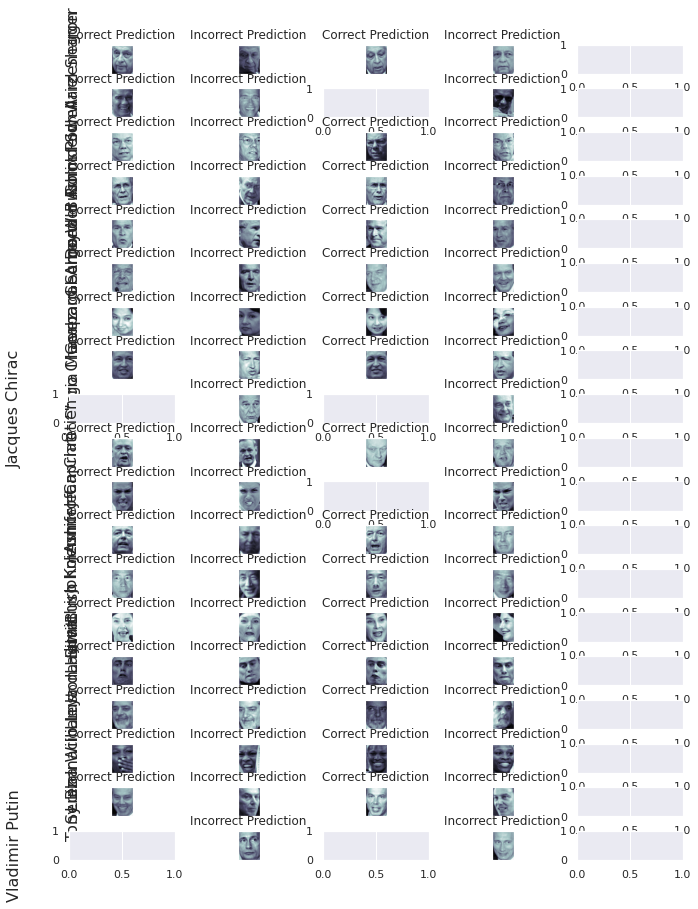

In [ ]:
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

faces = fetch_lfw_people(min_faces_per_person=40)

X_train, X_test, y_train, y_test = train_test_split(faces.data, faces.target, test_size=0.25, random_state=42)

pca = PCA(n_components=120)
X_train_pca = pca.fit_transform(X_train)


svm = SVC(kernel='rbf', gamma='scale', C=1.0, decision_function_shape='ovr')
svm.fit(X_train_pca, y_train)


X_test_pca = pca.transform(X_test)

y_pred = svm.predict(X_test_pca)


print(classification_report(y_test, y_pred, target_names=faces.target_names))

accuracy = svm.score(X_test_pca, y_test)
conf_mat = confusion_matrix(y_test, y_pred)
plt.imshow(conf_mat, cmap='Blues', interpolation='nearest')
plt.colorbar()
tick_marks = np.arange(len(faces.target_names))
plt.xticks(tick_marks, faces.target_names, rotation=90)
plt.yticks(tick_marks, faces.target_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title(f'Confusion Matrix (Accuracy={accuracy:.2f})')
plt.show()

correct_indices = []
incorrect_indices = []
for i in range(len(faces.target_names)):
    correct_idx = np.where((y_pred == i) & (y_test == i))[0]
    incorrect_idx = np.where((y_pred != i) & (y_test == i))[0]
    correct_indices.append(correct_idx)
    incorrect_indices.append(incorrect_idx)

fig, ax = plt.subplots(len(faces.target_names), 5, figsize=(11, 15))
fig.subplots_adjust(hspace=0.5)
for i, axi in enumerate(ax):

    for j in range(2):
        if len(correct_indices[i]) > j:
            index = correct_indices[i][j]
            axi[j*2].imshow(X_test[index].reshape(faces.images.shape[1], faces.images.shape[2]), cmap='bone')
            axi[j*2].set_title('Correct Prediction')
            axi[j*2].set(xticks=[], yticks=[])


    for j in range(2):
        if len(incorrect_indices[i]) > j:
            index = incorrect_indices[i][j]
            axi[j*2+1].imshow(X_test[index].reshape(faces.images.shape[1], faces.images.shape[2]), cmap='bone')
            axi[j*2+1].set_title('Incorrect Prediction')
            axi[j*2+1].set(xticks=[], yticks=[])


    axi[0].set_ylabel(faces.target_names[i], fontsize=16, rotation=90, labelpad=30)

plt.show()


From this project, I have learned various data analysis and machine learning techniques using Python. I have gained knowledge on how to work with different datasets, how to preprocess data, and how to train and evaluate different machine learning models.

The most fun part of this assignment was working on the face recognition project using PCA. It was a challenging and exciting task to implement a machine learning algorithm that can recognize faces. The most time-consuming and tedious part was preprocessing the data, cleaning and transforming it, and preparing it for analysis.

I would like to explore more advanced machine learning techniques such as deep learning and neural networks. I would also like to work on some real-world projects and apply the skills that I have learned in this assignment. For instance, I could use the Iris dataset to build a flower classification model that can predict the species of a flower based on its features. I could also use the face recognition model to build an authentication system that can recognize faces and grant access to authorized individuals. Overall, this assignment has been enlightening and has provided me with valuable skills and knowledge in data analysis and machine learning.



